<a href="https://colab.research.google.com/github/kevykibbz/aistaffs/blob/main/instance_segmentation_practice_20_01_2025_(2).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [3]:
!pip uninstall -y supervision
!pip install -q supervision==0.6.0

In [4]:
import supervision as sv
print(sv.__version__)

0.6.0


In [5]:
!pip install icrawler

In [6]:
import os
home=os.getcwd()
home

'/content'

In [7]:
images_dir=f"{home}/dataset/images/"
annotations_dir = f"{home}/dataset/annotations/"
os.makedirs(images_dir,exist_ok=True)
os.makedirs(annotations_dir,exist_ok=True)

In [8]:
from icrawler.builtin import GoogleImageCrawler

crawler=GoogleImageCrawler(storage={'root_dir':os.path.join(home, 'dataset','images')})
crawler.crawl(keyword="cats",max_num=10)

In [9]:
!git clone https://github.com/IDEA-Research/GroundingDINO.git

Cloning into 'GroundingDINO'...
remote: Enumerating objects: 463, done.
remote: Counting objects: 100% (240/240), done.
remote: Compressing objects: 100% (105/105), done.
remote: Total 463 (delta 175), reused 135 (delta 135), pack-reused 223 (from 1)
Receiving objects: 100% (463/463), 12.87 MiB | 15.94 MiB/s, done.
Resolving deltas: 100% (241/241), done.


In [19]:
%cd {home}/GroundingDINO
!git checkout -q 57535c5a79791cb76e36fdb64975271354f10251
!pip install -q -e .

/content/GroundingDINO
  Preparing metadata (setup.py) ... done


In [11]:
!pip install 'git+https://github.com/facebookresearch/segment-anything.git'

  Cloning https://github.com/facebookresearch/segment-anything.git to /tmp/pip-req-build-we0voii_
  Running command git clone --filter=blob:none --quiet https://github.com/facebookresearch/segment-anything.git /tmp/pip-req-build-we0voii_
  Resolved https://github.com/facebookresearch/segment-anything.git to commit dca509fe793f601edb92606367a655c15ac00fdf
  Preparing metadata (setup.py) ... done
  Created wheel for segment_anything: filename=segment_anything-1.0-py3-none-any.whl size=36592 sha256=85117a4901895f138f29ec739735d6ea9269a120256dd57f5cf03a4570696ed5
  Stored in directory: /tmp/pip-ephem-wheel-cache-6a733f6g/wheels/15/d7/bd/05f5f23b7dcbe70cbc6783b06f12143b0cf1a5da5c7b52dcc5
Successfully built segment_anything


In [12]:
%cd {home}
!mkdir -p {home}/weights

/content


In [13]:
%cd {home}/weights
!wget -q https://github.com/IDEA-Research/GroundingDINO/releases/download/v0.1.0-alpha/groundingdino_swint_ogc.pth

/content/weights


In [14]:
!wget -q https://dl.fbaipublicfiles.com/segment_anything/sam_vit_h_4b8939.pth -P /content/weights/

In [15]:
import locale
def getpreferredencoding(do_setlocale = True):
    return "UTF-8"
locale.getpreferredencoding = getpreferredencoding

In [16]:
%cd {home}
import torch

device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
device

/content


device(type='cuda', index=0)

In [17]:
GROUNDING_DINO_CONFIG_PATH = f'{home}/GroundingDINO/groundingdino/config/GroundingDINO_SwinT_OGC.py'
GROUNDING_DINO_CHECKPOINT_PATH = f'{home}/weights/groundingdino_swint_ogc.pth'
GROUNDING_DINO_CONFIG_PATH

'/content/GroundingDINO/groundingdino/config/GroundingDINO_SwinT_OGC.py'

In [20]:
from groundingdino.util.inference import Model
GD_model = Model(model_config_path=GROUNDING_DINO_CONFIG_PATH, model_checkpoint_path=GROUNDING_DINO_CHECKPOINT_PATH)

/usr/local/lib/python3.11/dist-packages/timm/models/layers/__init__.py:48: FutureWarning: Importing from timm.models.layers is deprecated, please import via timm.layers
  warnings.warn(f"Importing from {__name__} is deprecated, please import via timm.layers", FutureWarning)
/usr/local/lib/python3.11/dist-packages/torch/functional.py:534: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3595.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


final text_encoder_type: bert-base-uncased


/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


tokenizer_config.json:   0%|          | 0.00/48.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/570 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/440M [00:00<?, ?B/s]

/content/GroundingDINO/groundingdino/util/inference.py:32: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(model_checkpoint_path, map_location="cpu")


In [21]:
import cv2

image_path = f'{home}/dataset/images/000003.jpg'
image = cv2.imread(image_path)
height, width, _ = image.shape
max_dim = 200
scaling_factor = max_dim / max(height, width)
new_height = int(height * scaling_factor)
new_width = int(width * scaling_factor)
image_resized = cv2.resize(image, (new_width, new_height))
image_name = os.path.basename(image_path)
print(f"Resized image shape: {image_resized.shape}")


Resized image shape: (131, 200, 3)


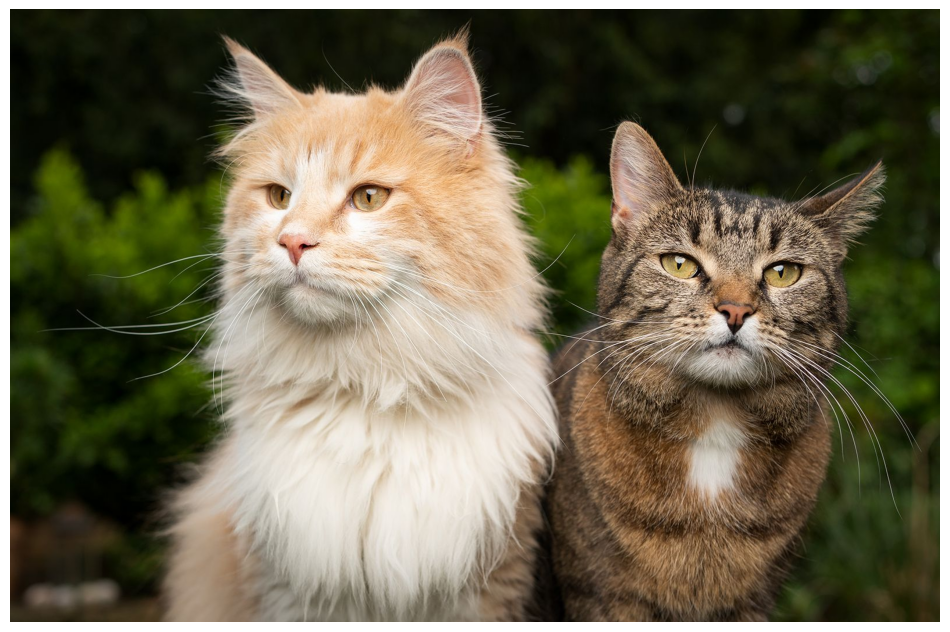

In [22]:
import supervision as sv
sv.plot_image(image)

In [23]:
# detect objects
CLASSES = ['cat']
detections = GD_model.predict_with_classes(
    image=image,
    classes=CLASSES,
    box_threshold=0.35,
    text_threshold=0.25
)
detections

/usr/local/lib/python3.11/dist-packages/transformers/modeling_utils.py:1113: FutureWarning: The `device` argument is deprecated and will be removed in v5 of Transformers.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torch/_dynamo/eval_frame.py:632: UserWarning: torch.utils.checkpoint: the use_reentrant parameter should be passed explicitly. In version 2.5 we will raise an exception if use_reentrant is not passed. use_reentrant=False is recommended, but if you need to preserve the current default behavior, you can pass use_reentrant=True. Refer to docs for more details on the differences between the two variants.
  return fn(*args, **kwargs)
/usr/local/lib/python3.11/dist-packages/torch/utils/checkpoint.py:87: UserWarning: None of the inputs have requires_grad=True. Gradients will be None
  warnings.warn(
/content/GroundingDINO/groundingdino/models/GroundingDINO/transformer.py:862: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocas

Detections(xyxy=array([[  49.738556,   21.128845,  955.8684  , 1051.4788  ],
       [ 910.6565  ,  187.71097 , 1563.6057  , 1052.2046  ]],
      dtype=float32), mask=None, confidence=array([0.83250844, 0.84907955], dtype=float32), class_id=array([0, 0]), tracker_id=None)

In [24]:
detected_boxes = detections.xyxy
print(detected_boxes,type(detected_boxes))

[[  49.738556   21.128845  955.8684   1051.4788  ]
 [ 910.6565    187.71097  1563.6057   1052.2046  ]] <class 'numpy.ndarray'>


In [25]:
class_id = detections.class_id
print(class_id)

[0 0]


In [26]:
def get_class_name(class_id, classes):
    try:
        class_name = classes[class_id - 1]
        return class_name.lower()
    except (IndexError, TypeError):
        return "unknown"

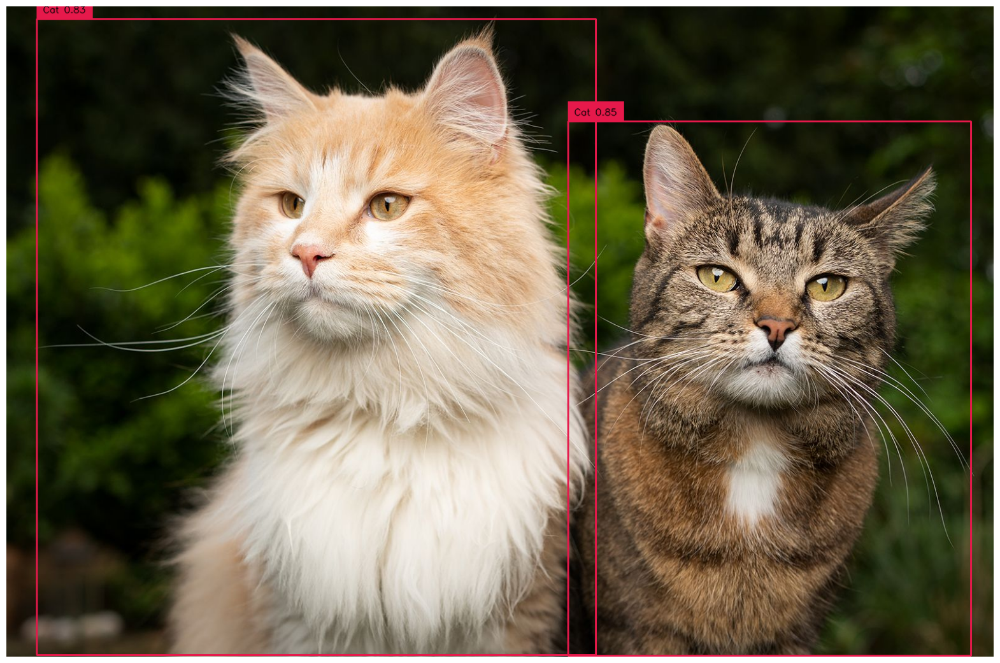

In [27]:
box_annotator = sv.BoxAnnotator()
labels = []

for detection in detections:
    xyxy, mask,confidence, class_id, _ = detection
    # Safely get a valid class name
    class_name = get_class_name(class_id, CLASSES).capitalize()
    labels.append(f"{class_name} {confidence:0.2f}")

annotated_frame = box_annotator.annotate(scene=image.copy(), detections=detections, labels=labels)

# Display the annotated image
%matplotlib inline
sv.plot_image(annotated_frame, (20, 20))


In [28]:
from segment_anything import sam_model_registry, SamPredictor

MODEL_TYPE = "vit_h"
CHECKPOINT_PATH = '/content/weights/sam_vit_h_4b8939.pth'

sam = sam_model_registry[MODEL_TYPE](checkpoint=CHECKPOINT_PATH).to(device=device)
mask_predictor = SamPredictor(sam)

/usr/local/lib/python3.11/dist-packages/segment_anything/build_sam.py:105: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state_dict = torch.load(f)


In [29]:
import numpy as np

def segmentor(sam_predictor, image, bboxes):
    result_masks = []

    for bbox in bboxes:
        sam_predictor.set_image(image)
        bbox = np.array(bbox, dtype=np.float32)
        masks, scores, logits = sam_predictor.predict(
            box=bbox,
            multimask_output=True
        )
        index = np.argmax(scores)
        result_masks.append(masks[index])
    return np.array(result_masks)


In [30]:
try:
    result_masks = segmentor(
        sam_predictor=mask_predictor,
        image=cv2.cvtColor(image, cv2.COLOR_BGR2RGB),
        bboxes=detected_boxes,
    )
    detections.mask=result_masks
except Exception as e:
    print(f"Error ocuured: {e}")
    detections.mask = None

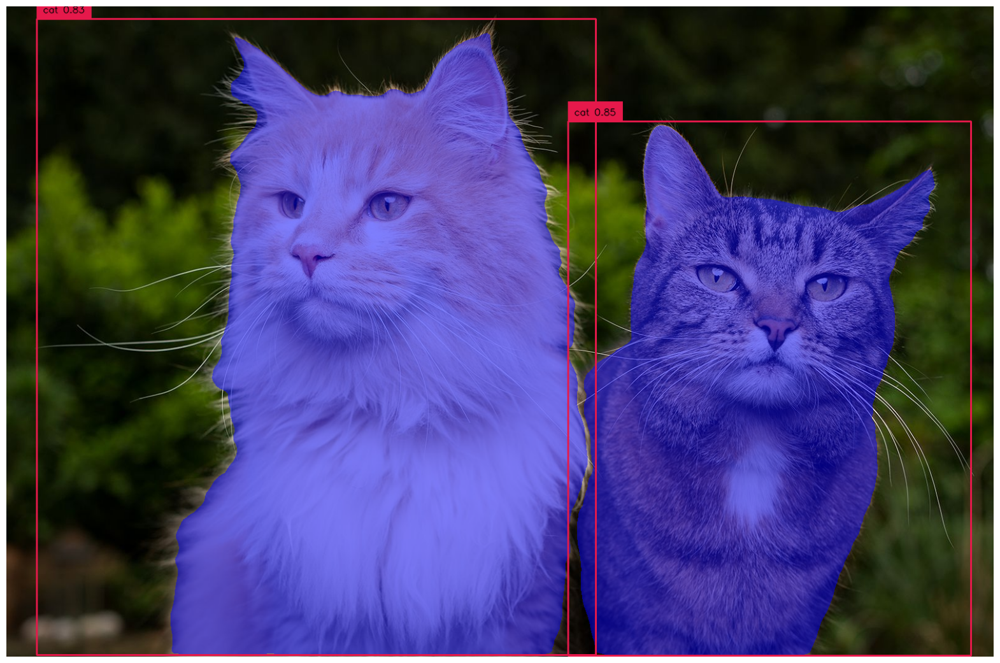

In [31]:
box_annotator = sv.BoxAnnotator()
mask_annotator = sv.MaskAnnotator(color=sv.Color.blue())

labels = []
for i in range(len(detections)):
    box = detections.xyxy[i]
    confidence = detections.confidence[i]
    class_id = detections.class_id[i]
    mask = detections.mask[i] if len(detections.mask) > i else None
    class_name = get_class_name(class_id, CLASSES)
    labels.append(f"{class_name} {confidence:0.2f}")

try:
    annotated_image = mask_annotator.annotate(scene=image.copy(), detections=detections)
    annotated_image = box_annotator.annotate(scene=annotated_image, detections=detections, labels=labels)
except Exception as e:
    print(f"Error during annotation: {e}")
    annotated_image = image.copy()

%matplotlib inline
sv.plot_image(annotated_image, (20, 20))

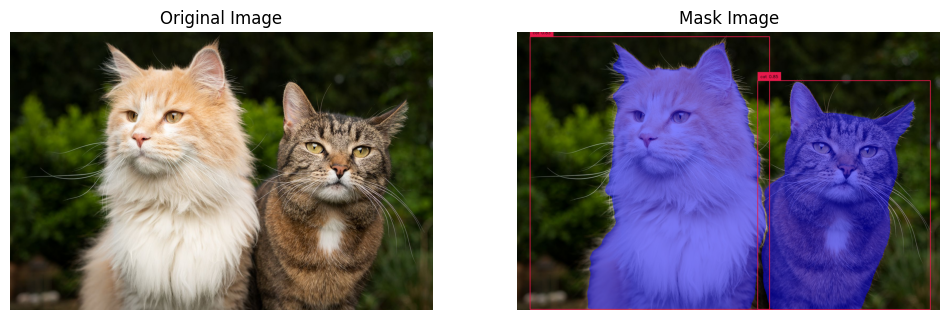

In [33]:
sv.plot_images_grid(
    images=[image, annotated_image],
    grid_size=(1,2),
    titles=['Original Image', 'Mask Image']

)


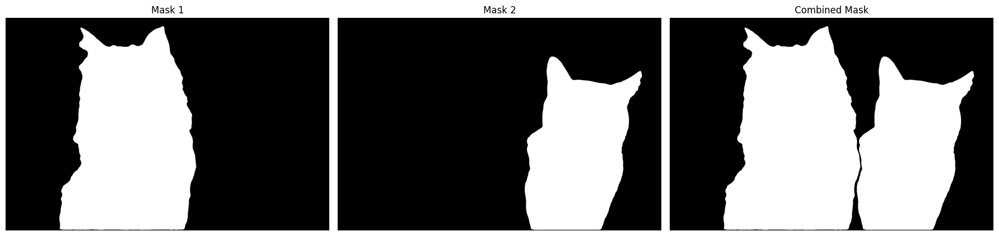

In [34]:
import matplotlib.pyplot as plt

# Combine the masks using logical OR
combined_mask = np.zeros_like(result_masks[0], dtype=np.uint8)
for mask in result_masks:
    combined_mask = np.logical_or(combined_mask, mask)

# Convert to uint8 for visualization (values 0 or 255)
combined_mask_image = (combined_mask.astype(np.uint8) * 255)

# Plot each individual mask
num_masks = len(result_masks)
fig, axes = plt.subplots(1, num_masks + 1, figsize=(6 * (num_masks + 1), 6))
if num_masks == 1:
    axes = [axes]

for i, (mask, ax) in enumerate(zip(result_masks, axes[:num_masks])):
    mask_image = (mask.astype(np.uint8) * 255)
    ax.imshow(mask_image, cmap='gray')
    ax.set_title(f"Mask {i + 1}")
    ax.axis('off')

# Plot the combined mask
axes[-1].imshow(combined_mask_image, cmap='gray')
axes[-1].set_title("Combined Mask")
axes[-1].axis('off')

# Adjust layout and show the figure
plt.tight_layout()
plt.show()


In [35]:
# Create a dataset with annotations
dataset = sv.Dataset(
    classes=CLASSES,
    images={image_name: image},  # Image data
    annotations={image_name: detections}  # Annotations in required format
)

In [36]:
for img_name, annotations in dataset.annotations.items():
    if annotations.mask is not None and annotations.mask.shape[0] != len(annotations.xyxy):
        # Replicate the mask to match the number of bounding boxes
        annotations.mask = np.tile(annotations.mask, (len(annotations.xyxy), 1, 1))


In [37]:

# Convert dataset to Pascal VOC format and save
dataset.as_pascal_voc(
    annotations_directory_path=annotations_dir,
    min_image_area_percentage=0.01,  # Filter small objects (as needed)
    max_image_area_percentage=0.95,  # Filter large objects (as needed)
    approximation_percentage=0.5    # Define overlap tolerance for annotations
)

# Check the annotations saved in Pascal VOC format
print(f"Annotations saved in Pascal VOC format in {annotations_dir}")

Annotations saved in Pascal VOC format in /content/dataset/annotations/


In [38]:
from tqdm import tqdm

masks=[]
images = []
max_images = 3  # Number of images to process and visualize

image_paths = sv.list_files_with_extensions(
    directory=images_dir,
    extensions=['jpg', 'jpeg', 'png']
)

# Iterate over all image files with progress tracking
for image_path in tqdm(image_paths, desc=f"Processing images in {images_dir}"):
    image_name = image_path.name
    image_path = str(image_path)
    image = cv2.imread(image_path)
    images.append(image)  # Store the image for visualization

    # Detect objects
    detections = GD_model.predict_with_classes(
        image=image,
        classes=CLASSES,
        box_threshold=0.35,
        text_threshold=0.25
    )
    detected_boxes = detections.xyxy
    if detected_boxes is not None:
        try:
            result_masks= segmentor(
                sam_predictor=mask_predictor,
                image=cv2.cvtColor(image, cv2.COLOR_BGR2RGB),
                bboxes=detected_boxes,
            )
            masks.append(result_masks)
            detections.mask=result_masks

            # Create a dataset with annotations
            dataset = sv.Dataset(
                classes=CLASSES,
                images={image_name: image},  # Image data
                annotations={image_name: detections}  # Annotations in required format
            )
            # Convert dataset to Pascal VOC format and save
            dataset.as_pascal_voc(
                annotations_directory_path=annotations_dir,
                min_image_area_percentage=0.01,  # Filter small objects (as needed)
                max_image_area_percentage=0.95,  # Filter large objects (as needed)
                approximation_percentage=0.5    # Define overlap tolerance for annotations
            )
        except Exception as e:
            print(f"Error ocuured: {e}")
            detections.mask = None

# Check the annotations saved in Pascal VOC format
print(f"Annotations saved in Pascal VOC format in {annotations_dir}")

Processing images in /content/dataset/images/: 100%|██████████| 10/10 [00:25<00:00,  2.54s/it]

Annotations saved in Pascal VOC format in /content/dataset/annotations/


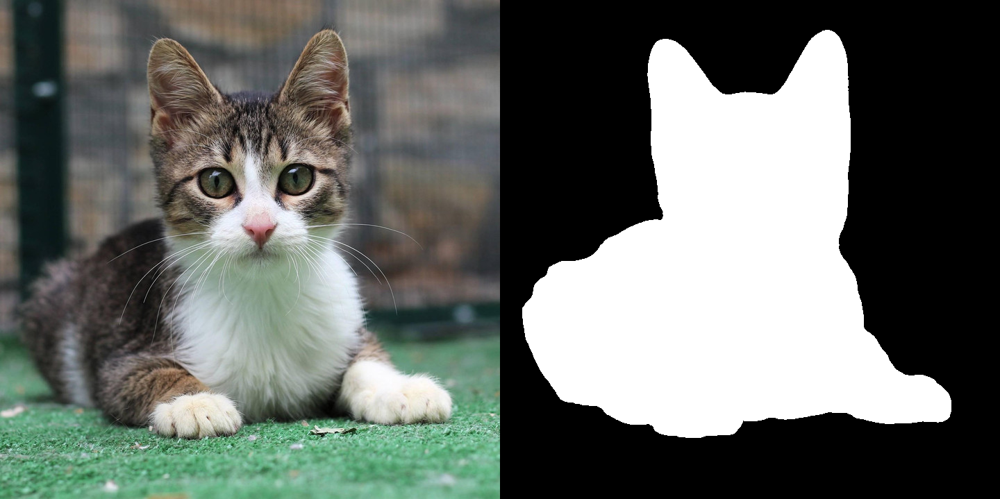

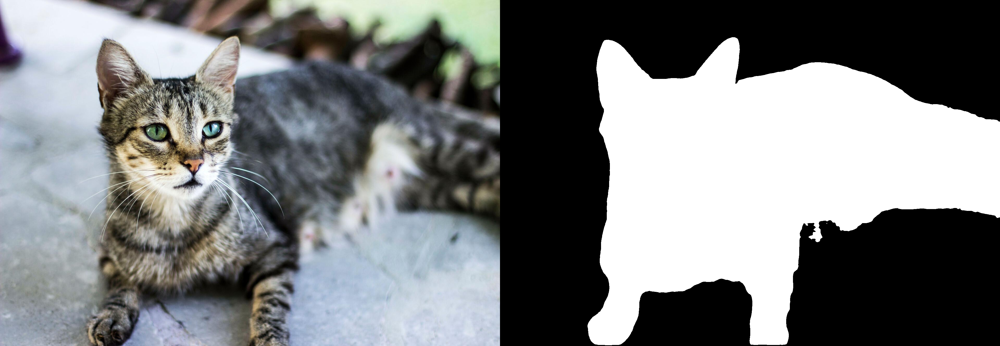

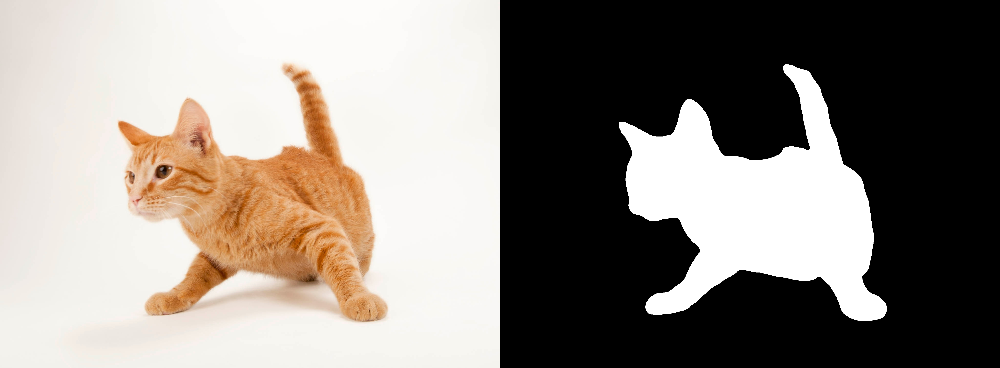

In [39]:
from PIL import Image
from IPython.display import display

# Display the first three images with their corresponding masks
for idx in range(3):
    if idx >= len(image_paths) or idx >= len(masks):
        print(f"Not enough images or masks available to display {idx + 1}.")
        break

    # Read the image
    image_path = image_paths[idx]
    image = cv2.imread(str(image_path))
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    pil_image = Image.fromarray(image_rgb)

    # Get the mask
    mask = masks[idx]
    # Convert the boolean mask to uint8 format (255 for True, 0 for False)
    mask_uint8 = np.uint8(mask[0] * 255)
    mask_rgb = cv2.cvtColor(mask_uint8, cv2.COLOR_GRAY2RGB)  # Convert to RGB format
    pil_mask = Image.fromarray(mask_rgb)

    # Combine image and mask side by side
    combined_image = Image.new('RGB', (pil_image.width + pil_mask.width, max(pil_image.height, pil_mask.height)))

    # Paste the image and the mask into the combined image
    combined_image.paste(pil_image, (0, 0))
    combined_image.paste(pil_mask, (pil_image.width, 0))

    # Display the combined image
    display(combined_image)


In [40]:
import shutil
import random
import xml.etree.ElementTree as ET

combined_base_dir = f'{home}/mask-segment-project'

# Create the train and val directories
train_dir = os.path.join(combined_base_dir, 'train')
val_dir = os.path.join(combined_base_dir, 'val')
os.makedirs(train_dir, exist_ok=True)
os.makedirs(val_dir, exist_ok=True)

# Create subdirectories for images and annotations
train_images_dir = os.path.join(train_dir, 'images')
train_annotations_dir = os.path.join(train_dir, 'annotations')
val_images_dir = os.path.join(val_dir, 'images')
val_annotations_dir = os.path.join(val_dir, 'annotations')

os.makedirs(train_images_dir, exist_ok=True)
os.makedirs(train_annotations_dir, exist_ok=True)
os.makedirs(val_images_dir, exist_ok=True)
os.makedirs(val_annotations_dir, exist_ok=True)

In [56]:
# Split ratio
split_ratio = 0.8
source_images_dir = f'{home}/dataset/images'
source_annotations_dir = f'{home}/dataset/annotations'
images = [f for f in os.listdir(source_images_dir) if f.endswith('.jpg') or f.endswith('.png')]
random.shuffle(images)

# Determine train and val set sizes
train_size = int(len(images) * split_ratio)
train_images = images[:train_size]
val_images = images[train_size:]

# Function to copy images and annotations to the corresponding directories
def copy_files(image_list, target_images_dir, target_annotations_dir, source_images_dir, source_annotations_dir):
    for image_filename in image_list:
        # Construct paths for image and annotation
        image_path = os.path.join(source_images_dir, image_filename)
        annotation_filename = image_filename.replace('.jpg', '.xml').replace('.png', '.xml')
        annotation_path = os.path.join(source_annotations_dir, annotation_filename)

        # Copy the image file
        shutil.copy(image_path, os.path.join(target_images_dir, image_filename))

        # Copy the annotation file
        if os.path.exists(annotation_path):
            shutil.copy(annotation_path, os.path.join(target_annotations_dir, annotation_filename))
        else:
            print(f"Annotation for {image_filename} not found!")

# Copy images and annotations for train and val sets
copy_files(train_images, train_images_dir, train_annotations_dir, source_images_dir, source_annotations_dir)
copy_files(val_images, val_images_dir, val_annotations_dir, source_images_dir, source_annotations_dir)

print("Dataset split and annotations copied successfully!")

Dataset split and annotations copied successfully!


In [ ]:
!pip install roboflow

In [ ]:
import roboflow
roboflow.login(force=True)

visit https://app.roboflow.com/auth-cli to get your authentication token.


Paste the authentication token here:  ········


In [ ]:
PROJECT_NAME = "cats-images-instance-segmentations-1"
PROJECT_DESCRIPTION = "cats-images-instance-segmentations-1"

In [ ]:
from roboflow import Roboflow

workspace = Roboflow().workspace()
new_project = workspace.create_project(
    project_name=PROJECT_NAME,
    project_license="MIT",
    project_type="instance-segmentation",
    annotation=PROJECT_DESCRIPTION)

loading Roboflow workspace...
loading Roboflow project...


In [ ]:
!roboflow workspace list


masksrcnnsegementations (default workspace)
  link: https://app.roboflow.com/masksrcnnsegementations
  id: masksrcnnsegementations


In [ ]:
!roboflow project list

loading Roboflow workspace...

cats-images-instance-segmentations-1
  link: https://app.roboflow.com/testing-r1y34/cats-images-instance-segmentations-1
  id: testing-r1y34/cats-images-instance-segmentations-1
  type: instance-segmentation
  versions: 0
  images: 0
  classes: dict_keys([])

Hard Hat Sample
  link: https://app.roboflow.com/testing-r1y34/hard-hat-sample-au0rq
  id: testing-r1y34/hard-hat-sample-au0rq
  type: object-detection
  versions: 2
  images: 100
  classes: dict_keys(['head', 'person', 'helmet'])

Paddy Pest Detection
  link: https://app.roboflow.com/testing-r1y34/paddy-pest-detection-knhu3
  id: testing-r1y34/paddy-pest-detection-knhu3
  type: object-detection
  versions: 2
  images: 0
  classes: dict_keys(['butterfly', 'Without Pests', 'With Pests', 'pest'])


In [ ]:
!roboflow import -w masksrcnnsegementations  -p cats-images-instance-segmentations-1-igz8g {combined_base_dir}

loading Roboflow workspace...
100%|███████████████████████████████████████| 10/10 [00:00<00:00, 227951.30it/s]
loading Roboflow project...
Uploading to existing project masksrcnnsegementations/cats-images-instance-segmentations-1-igz8g
[DUPLICATE] /kaggle/working/mask-segment-project/train/images/000007.jpg (fwFnRUNjzis29dLWzdpD) [1.1s]
[DUPLICATE] /kaggle/working/mask-segment-project/train/images/000010.jpg (GZ0TtOckW38a8c3GA10q) [1.2s]
[DUPLICATE] /kaggle/working/mask-segment-project/train/images/000006.jpg (danDqY9U0owSHyz4q3Ll) [1.5s]
[DUPLICATE] /kaggle/working/mask-segment-project/val/images/000003.jpg (pROUrE5SYooU2ZPkQgB2) [1.6s]
[DUPLICATE] /kaggle/working/mask-segment-project/val/images/000009.jpg (x0bF4APEy5XGQpDj39B5) [1.6s]
[DUPLICATE] /kaggle/working/mask-segment-project/train/images/000008.jpg (i2vUWs0Dn7MMvqA3qrly) [1.7s]
[DUPLICATE] /kaggle/working/mask-segment-project/train/images/000004.jpg (LtA3F1pyIPeUIIJVq1sl) [1.9s]
[DUPLICATE] /kaggle/working/mask-segment-projec

In [57]:
import json
from pathlib import Path
from pycocotools.coco import COCO

def convert_pascal_voc_to_coco(voc_annotations_dir, output_json_path, image_dir):
  # Check if the VOC annotations directory is empty
    if not any(Path(voc_annotations_dir).glob("*.xml")):
        print(f"Error: The directory '{voc_annotations_dir}' is empty or contains no XML files.")
        return

    coco = COCO()
    coco.dataset = {
        "info": {"description": "Pascal VOC to COCO Conversion with Segmentation", "version": "1.0", "year": 2024},
        "licenses": [],
        "images": [],
        "annotations": [],
        "categories": [],
    }
    coco.categories = []

    categories = set()
    annotation_id = 1
    image_id = 1

    for xml_file in Path(voc_annotations_dir).glob("*.xml"):
        tree = ET.parse(xml_file)
        root = tree.getroot()

        image_name = root.find("filename").text
        image_path = os.path.join(image_dir, image_name)
        try:
            size = root.find("size")
            width = int(size.find("width").text)
            height = int(size.find("height").text)
        except AttributeError:
            print(f"Skipping {xml_file} due to missing size information.")
            continue

        coco.dataset["images"].append(
            {
                "id": image_id,
                "file_name": image_name,
                "height": height,
                "width": width,
            }
        )

        img = cv2.imread(image_path)  # Read the image using OpenCV
        if img is None:
            print(f"Skipping {xml_file} due to image reading error.")
            image_id += 1
            continue

        for obj in root.findall("object"):
            category = obj.find("name").text
            categories.add(category)

            # Extract bounding box data
            bbox = obj.find("bndbox")
            x_min = int(bbox.find("xmin").text)
            y_min = int(bbox.find("ymin").text)
            x_max = int(bbox.find("xmax").text)
            y_max = int(bbox.find("ymax").text)
            width = x_max - x_min
            height = y_max - y_min

            # Create an empty list for segmentation data
            segmentation = []

            # Check if the object has polygon-based segmentation
            polygon = obj.find('polygon')
            if polygon is not None:
                points = []
                for i in range(1, len(polygon)):
                    x_tag = polygon.find(f'x{i}')
                    y_tag = polygon.find(f'y{i}')
                    if x_tag is None or y_tag is None:  # Stop if no further points exist
                        break
                    x = int(x_tag.text)
                    y = int(y_tag.text)
                    points.append([x, y])
                # Flatten the points into the format required for COCO segmentation
                segmentation = [point for point_pair in points for point in point_pair]

            if segmentation:
                coco.dataset["annotations"].append(
                    {
                        "id": annotation_id,
                        "image_id": image_id,
                        "category_id": list(categories).index(category),
                        "bbox": [x_min, y_min, width, height],
                        "area": width * height,
                        "iscrowd": 0,
                        "segmentation": [segmentation],  # Add segmentation data
                    }
                )
                annotation_id += 1

        image_id += 1

    # Add category information to the COCO dataset
    for i, category_name in enumerate(categories):
        coco.dataset["categories"].append({"id": i, "name": category_name, "supercategory": "none"})

    # Save COCO formatted JSON
    with open(output_json_path, "w") as f:
        json.dump(coco.dataset, f, indent=4)
    print(f"COCO JSON annotations saved to {output_json_path}")

# Example Usage
train_voc_annotations_dir = f"{combined_base_dir}/train/annotations"
val_voc_annotations_dir = f"{combined_base_dir}/val/annotations"
train_image_dir = f"{combined_base_dir}/train/images"
val_image_dir = f"{combined_base_dir}/val/images"
train_output_json_path = f"{combined_base_dir}/train/annotations.json"
val_output_json_path = f"{combined_base_dir}/val/annotations.json"

convert_pascal_voc_to_coco(train_voc_annotations_dir, train_output_json_path, train_image_dir)
convert_pascal_voc_to_coco(val_voc_annotations_dir, val_output_json_path, val_image_dir)
print("Dataset annotations created successfully!")

COCO JSON annotations saved to /content/mask-segment-project/train/annotations.json
COCO JSON annotations saved to /content/mask-segment-project/val/annotations.json
Dataset annotations created successfully!


In [42]:
!pip install -q 'git+https://github.com/facebookresearch/detectron2.git'

  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.2/50.2 kB 3.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.2/79.2 kB 5.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 117.0/117.0 kB 12.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.5/154.5 kB 16.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.5/79.5 kB 7.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 54.9 MB/s eta 0:00:00


In [43]:
import detectron2
from detectron2 import model_zoo
from detectron2.engine import DefaultTrainer
from detectron2.config import get_cfg
from detectron2.data import DatasetCatalog, MetadataCatalog
from detectron2.utils.visualizer import Visualizer
from detectron2.structures import BoxMode
from detectron2.data.datasets import register_coco_instances
from detectron2.model_zoo import get_checkpoint_url

In [59]:
DatasetCatalog.remove("train_dataset")
MetadataCatalog.remove("train_dataset")

In [60]:
# Register the train and validation datasets
register_coco_instances("train_dataset", {}, train_output_json_path, train_image_dir)
register_coco_instances("val_dataset", {}, val_output_json_path, val_image_dir)

# Create MetadataCatalog
train_metadata = MetadataCatalog.get("train_dataset")
val_metadata = MetadataCatalog.get("val_dataset")

In [61]:
train_metadata

namespace(name='train_dataset',
          json_file='/content/mask-segment-project/train/annotations.json',
          image_root='/content/mask-segment-project/train/images',
          evaluator_type='coco')

In [62]:
val_metadata

namespace(name='val_dataset',
          json_file='/content/mask-segment-project/val/annotations.json',
          image_root='/content/mask-segment-project/val/images',
          evaluator_type='coco')

In [47]:
# Get the configuration
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))  # Mask R-CNN with ResNet-50
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")  # Pretrained weightscfg.DATASETS.TRAIN = ("train_dataset",)
cfg.DATASETS.TRAIN = ("train_dataset",)
cfg.DATASETS.TEST = ("val_dataset")
cfg.DATALOADER.NUM_WORKERS = 2
# cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.IMS_PER_BATCH = 8
cfg.SOLVER.BASE_LR = 0.00025
cfg.SOLVER.MAX_ITER = 300  # Change based on your needs
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1  # Update if you have more categories

# Output path for the trained model
cfg.OUTPUT_DIR = f"{combined_base_dir}/output"
os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)

In [63]:
# Start training
trainer = DefaultTrainer(cfg)
trainer.resume_or_load(resume=False)
trainer.train()

[01/20 12:09:02 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

model_final_f10217.pkl: 178MB [00:01, 120MB/s]                           
roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, weight}
roi_heads.mask_head.predictor.{bias, weight}


[01/20 12:09:03 d2.engine.train_loop]: Starting training from iteration 0
[01/20 12:10:03 d2.utils.events]:  eta: 0:12:56  iter: 19  total_loss: 1.671  loss_cls: 0.5432  loss_box_reg: 0.4289  loss_mask: 0.6907  loss_rpn_cls: 0.003182  loss_rpn_loc: 0.0126    time: 2.7966  last_time: 2.5284  data_time: 0.6791  last_data_time: 0.6199   lr: 1.6068e-05  max_mem: 13067M
[01/20 12:11:02 d2.utils.events]:  eta: 0:12:13  iter: 39  total_loss: 1.485  loss_cls: 0.4185  loss_box_reg: 0.4301  loss_mask: 0.6314  loss_rpn_cls: 0.002769  loss_rpn_loc: 0.01368    time: 2.8562  last_time: 2.3471  data_time: 0.7445  last_data_time: 0.3916   lr: 3.2718e-05  max_mem: 13067M
[01/20 12:12:02 d2.utils.events]:  eta: 0:11:17  iter: 59  total_loss: 1.237  loss_cls: 0.2834  loss_box_reg: 0.4249  loss_mask: 0.5209  loss_rpn_cls: 0.001828  loss_rpn_loc: 0.01515    time: 2.9042  last_time: 3.9097  data_time: 0.7736  last_data_time: 1.5238   lr: 4.9367e-05  max_mem: 13067M
[01/20 12:12:58 d2.utils.events]:  eta: 0:

KeyError: "Dataset 'v' is not registered! Available datasets are: coco_2014_train, coco_2014_val, coco_2014_minival, coco_2014_valminusminival, coco_2017_train, coco_2017_val, coco_2017_test, coco_2017_test-dev, coco_2017_val_100, keypoints_coco_2014_train, keypoints_coco_2014_val, keypoints_coco_2014_minival, keypoints_coco_2014_valminusminival, keypoints_coco_2017_train, keypoints_coco_2017_val, keypoints_coco_2017_val_100, coco_2017_train_panoptic_separated, coco_2017_train_panoptic_stuffonly, coco_2017_train_panoptic, coco_2017_val_panoptic_separated, coco_2017_val_panoptic_stuffonly, coco_2017_val_panoptic, coco_2017_val_100_panoptic_separated, coco_2017_val_100_panoptic_stuffonly, coco_2017_val_100_panoptic, lvis_v1_train, lvis_v1_val, lvis_v1_test_dev, lvis_v1_test_challenge, lvis_v0.5_train, lvis_v0.5_val, lvis_v0.5_val_rand_100, lvis_v0.5_test, lvis_v0.5_train_cocofied, lvis_v0.5_val_cocofied, cityscapes_fine_instance_seg_train, cityscapes_fine_sem_seg_train, cityscapes_fine_instance_seg_val, cityscapes_fine_sem_seg_val, cityscapes_fine_instance_seg_test, cityscapes_fine_sem_seg_test, cityscapes_fine_panoptic_train, cityscapes_fine_panoptic_val, voc_2007_trainval, voc_2007_train, voc_2007_val, voc_2007_test, voc_2012_trainval, voc_2012_train, voc_2012_val, ade20k_sem_seg_train, ade20k_sem_seg_val, val_dataset, train_dataset"

In [64]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader

# Create evaluator
evaluator = COCOEvaluator("val_dataset", cfg, False, output_dir=cfg.OUTPUT_DIR)
val_loader = build_detection_test_loader(cfg, "val_dataset")

# Run evaluation
metrics = inference_on_dataset(trainer.model, val_loader, evaluator)
print(metrics)


WARNING [01/20 12:25:23 d2.evaluation.coco_evaluation]: COCO Evaluator instantiated using config, this is deprecated behavior. Please pass in explicit arguments instead.
WARNING [01/20 12:25:23 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[01/20 12:25:23 d2.data.datasets.coco]: Loaded 2 images in COCO format from /content/mask-segment-project/val/annotations.json
[01/20 12:25:23 d2.data.build]: Distribution of instances among all 1 categories:
|  category  | #instances   |
|:----------:|:-------------|
|    cat     | 3            |
|            |              |
[01/20 12:25:23 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[01/20 12:25:23 d2.data.common]: Serializing the dataset using: <class 'detectron2.data.common._TorchSerializedList'>
[01/20 12:25:23 d2.data.common]: Serializing 2 elements to byte te

In [79]:
!wget -q https://cdn.theatlantic.com/thumbor/yHhIvkBiGvKKubxVHTNXvU4nCKQ=/1x122:2554x1452/1200x625/media/img/mt/2017/06/shutterstock_319985324/original.jpg -O /content/cat.jpg

In [74]:
from detectron2.engine import DefaultPredictor

# Load the trained model
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
predictor = DefaultPredictor(cfg)

cat_image=f'{home}/cat.jpg'
cat_image

[01/20 12:32:30 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from /content/mask-segment-project/output/model_final.pth ...


/usr/local/lib/python3.11/dist-packages/fvcore/common/checkpoint.py:252: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  return torch.load(f, map_location=torch.device("cpu"))

'/content/cat.jpg'

In [80]:
# Perform inference on a test image
test_image = cv2.imread(cat_image)
outputs = predictor(test_image)

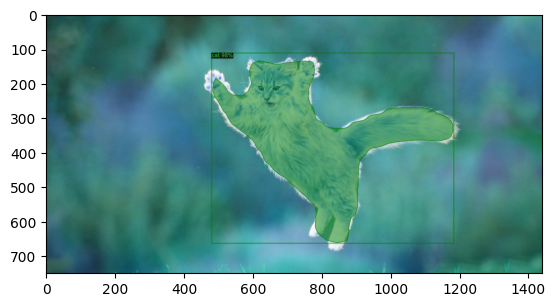

In [81]:
# Visualize the results
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog

v = Visualizer(test_image[:, :, ::-1], MetadataCatalog.get("train_dataset"), scale=1.2)
v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
result_image = v.get_image()[:, :, ::-1]
plt.imshow(result_image)
plt.show()